# Импортовање библиотека

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy
import os
import sys
import pickle


In [2]:
import soundfile
import librosa
import librosa.display

C:\ProgramData\Anaconda3\lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated
  "class": algorithms.Blowfish,


In [3]:
import IPython
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import tensorflow as tf
from tensorflow import keras
import keras
from keras.models import Sequential,Model, load_model
from keras.layers import Dense, Dropout, Flatten, LSTM
from keras.layers import Conv2D, MaxPooling2D, Conv1D, MaxPooling1D, MaxPool1D, GaussianNoise, GlobalMaxPooling1D
from keras.layers import BatchNormalization
from keras.callbacks import ModelCheckpoint

# Читање фајла

In [4]:
audio_label = []
data_audio = []
path = 'C:/Users/Dragana/Downloads/archive/Data/genres_original'
#sr = 45600
#sr = 20000
num_segments = 10;

for root, directories, files in os.walk(path):
      for file in files:
          print(file)
          dot_id = file.find( '.');
          name = file[:dot_id]
          audio, sr = librosa.load(path+'/'+name+'/'+file);
          #print(audio.shape)
          data_audio.append(audio)
          audio_label.append(name)
data_audio = np.array(data_audio)

blues.00000.wav
blues.00001.wav
blues.00002.wav
blues.00003.wav
blues.00004.wav
blues.00005.wav
blues.00006.wav
blues.00007.wav
blues.00008.wav
blues.00009.wav
blues.00010.wav
blues.00011.wav
blues.00012.wav
blues.00013.wav
blues.00014.wav
blues.00015.wav
blues.00016.wav
blues.00017.wav
blues.00018.wav
blues.00019.wav
blues.00020.wav
blues.00021.wav
blues.00022.wav
blues.00023.wav
blues.00024.wav
blues.00025.wav
blues.00026.wav
blues.00027.wav
blues.00028.wav
blues.00029.wav
blues.00030.wav
blues.00031.wav
blues.00032.wav
blues.00033.wav
blues.00034.wav
blues.00035.wav
blues.00036.wav
blues.00037.wav
blues.00038.wav
blues.00039.wav
blues.00040.wav
blues.00041.wav
blues.00042.wav
blues.00043.wav
blues.00044.wav
blues.00045.wav
blues.00046.wav
blues.00047.wav
blues.00048.wav
blues.00049.wav
blues.00050.wav
blues.00051.wav
blues.00052.wav
blues.00053.wav
blues.00054.wav
blues.00055.wav
blues.00056.wav
blues.00057.wav
blues.00058.wav
blues.00059.wav
blues.00060.wav
blues.00061.wav
blues.00

hiphop.00079.wav
hiphop.00080.wav
hiphop.00081.wav
hiphop.00082.wav
hiphop.00083.wav
hiphop.00084.wav
hiphop.00085.wav
hiphop.00086.wav
hiphop.00087.wav
hiphop.00088.wav
hiphop.00089.wav
hiphop.00090.wav
hiphop.00091.wav
hiphop.00092.wav
hiphop.00093.wav
hiphop.00094.wav
hiphop.00095.wav
hiphop.00096.wav
hiphop.00097.wav
hiphop.00098.wav
hiphop.00099.wav
jazz.00000.wav
jazz.00001.wav
jazz.00002.wav
jazz.00003.wav
jazz.00004.wav
jazz.00005.wav
jazz.00006.wav
jazz.00007.wav
jazz.00008.wav
jazz.00009.wav
jazz.00010.wav
jazz.00011.wav
jazz.00012.wav
jazz.00013.wav
jazz.00014.wav
jazz.00015.wav
jazz.00016.wav
jazz.00017.wav
jazz.00018.wav
jazz.00019.wav
jazz.00020.wav
jazz.00021.wav
jazz.00022.wav
jazz.00023.wav
jazz.00024.wav
jazz.00025.wav
jazz.00026.wav
jazz.00027.wav
jazz.00028.wav
jazz.00029.wav
jazz.00030.wav
jazz.00031.wav
jazz.00032.wav
jazz.00033.wav
jazz.00034.wav
jazz.00035.wav
jazz.00036.wav
jazz.00037.wav
jazz.00038.wav
jazz.00039.wav
jazz.00040.wav
jazz.00041.wav
jazz.00042.wa

C:\Users\Dragana\AppData\Local\Temp\ipykernel_11740\3015576514.py:17: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  data_audio = np.array(data_audio)


# Опис проблема

In [5]:
audio_label = np.array(audio_label)
classes = np.unique(audio_label)

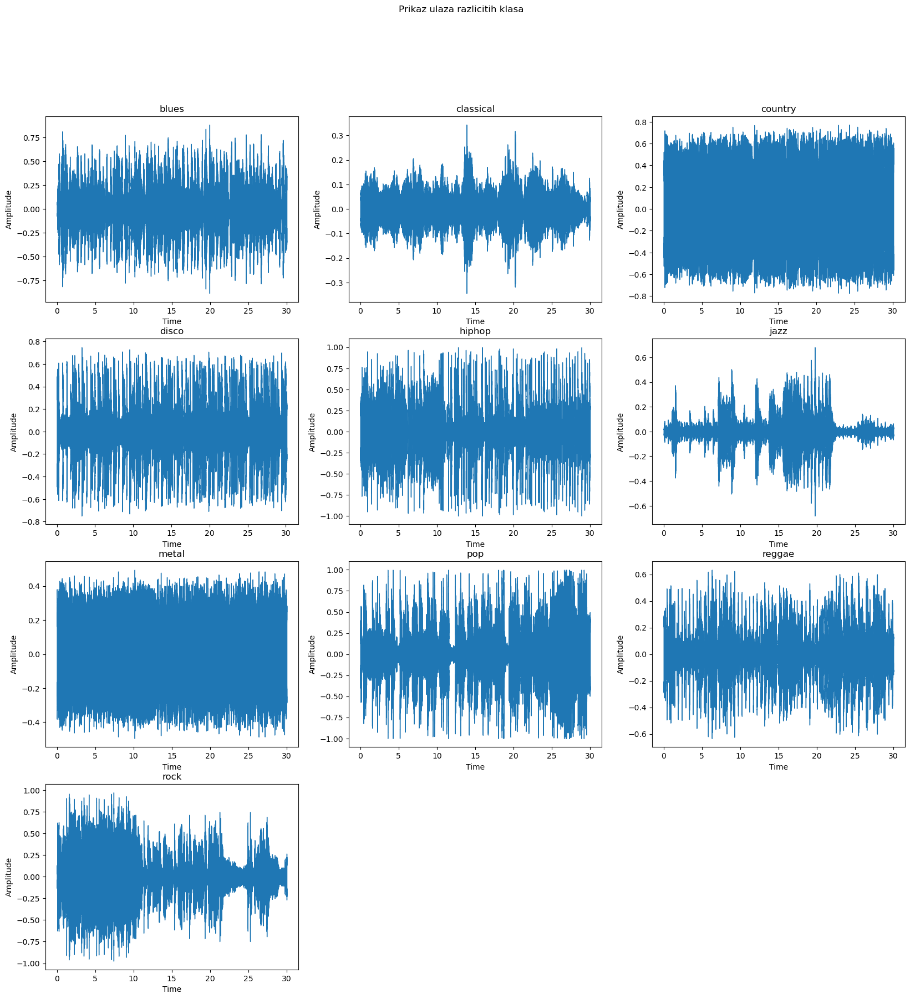

In [6]:
fig = plt.figure(figsize=(20,20))
fig.suptitle('Prikaz ulaza razlicitih klasa')
for i in range(0, len(classes)):
    d = data_audio[audio_label ==classes[i]][0]
    plt.subplot(4,3,i+1)
    librosa.display.waveshow(d)
    plt.xlabel('Time')
    plt.ylabel('Amplitude')
    plt.title(classes[i])

У пројекту је коришћен GTZAN dataset који се састоји од 10 жанрова при чему за сваки од жанрова имамо 100 снимака од по 30 секунди музике које припада том жанру. На претходном графику приказани су изгледи снимака за све жанрове. Може се приметити да се подаци жанрова међусобно разликују, при чему су неки слични попут discо и hiphop, classical и jazz, док су неки подаци различити попут metal и jazz, pop и rock. Из овога можемо анализирати само јачину гласа, да би извукли друге информације потребно је сагледати другачија обележја.

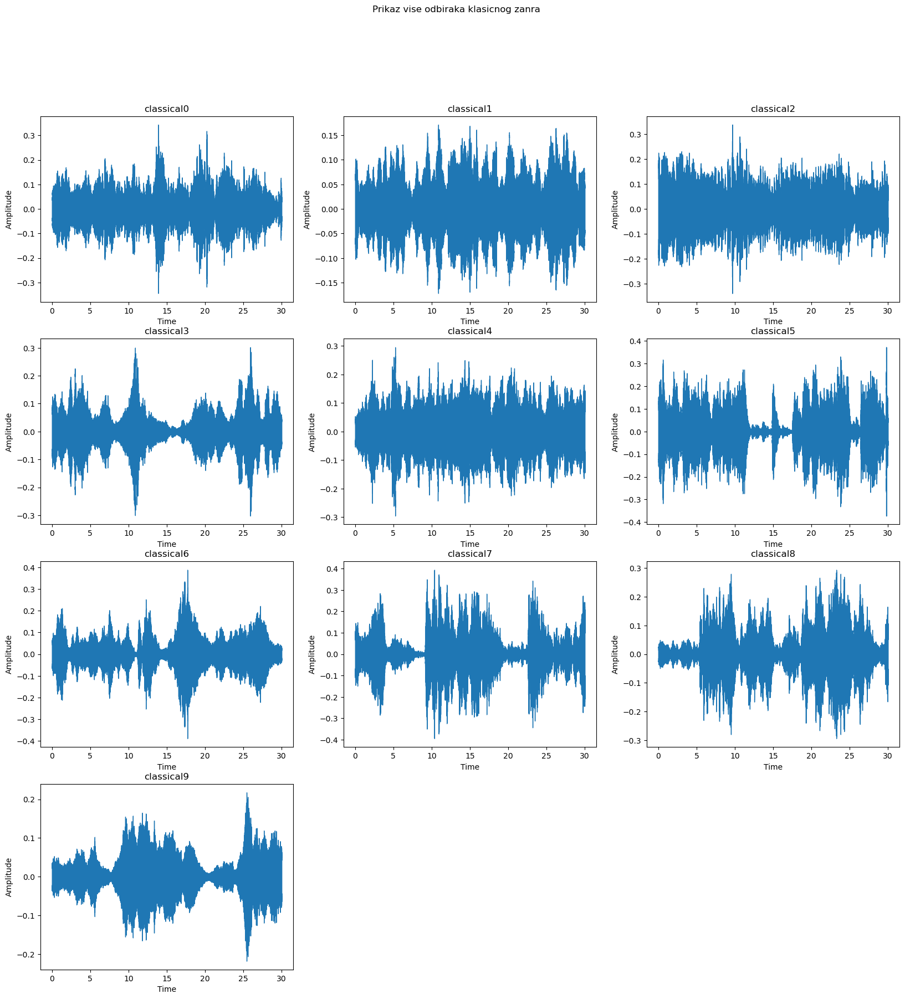

In [7]:
fig = plt.figure(figsize=(20,20))
fig.suptitle('Prikaz vise odbiraka klasicnog zanra')
i = 0;
for d in data_audio[audio_label == classes[1]][0:10]:
    plt.subplot(4,3,i+1)
    librosa.display.waveshow(d)
    plt.xlabel('Time')
    plt.ylabel('Amplitude')
    plt.title(classes[1]+str(i))
    i = i+1

На слици изнад приказани су подаци за класичну музику и можемо да приеметимо њихову међусобну сличност.

## Short time Fourier Transform

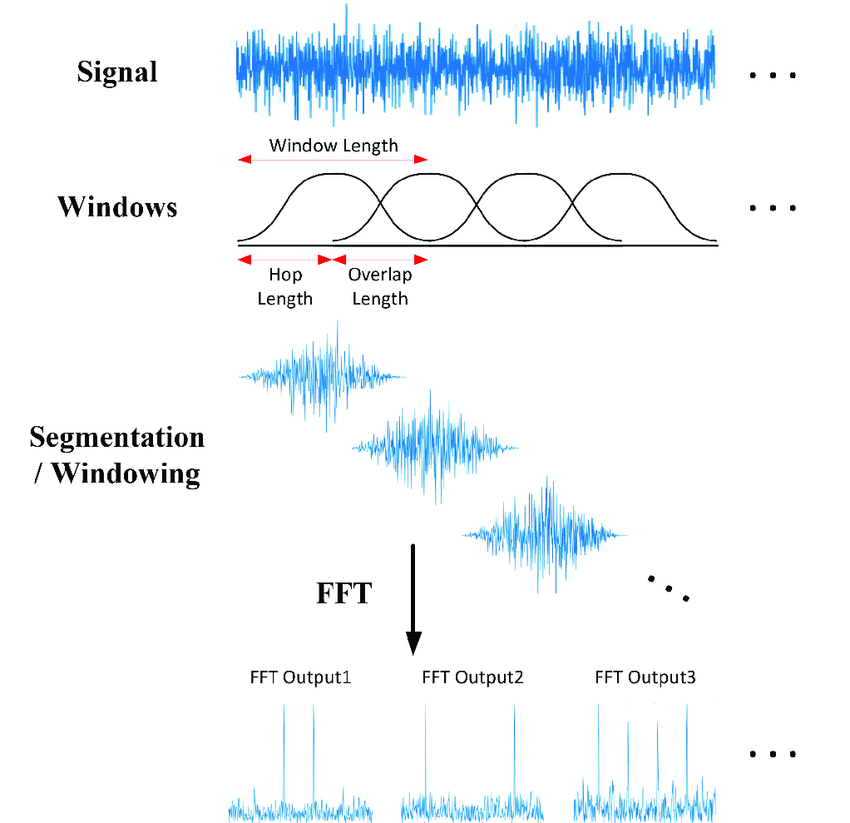

STFT се добија тако што узмемо прозор који померамо кроз секвенцу и радимо Фуријеову трансформацију. На крају ће се за сваки положај средине прозора добити његов спектар. Испод можемо видети 2D приказ овог обележја.

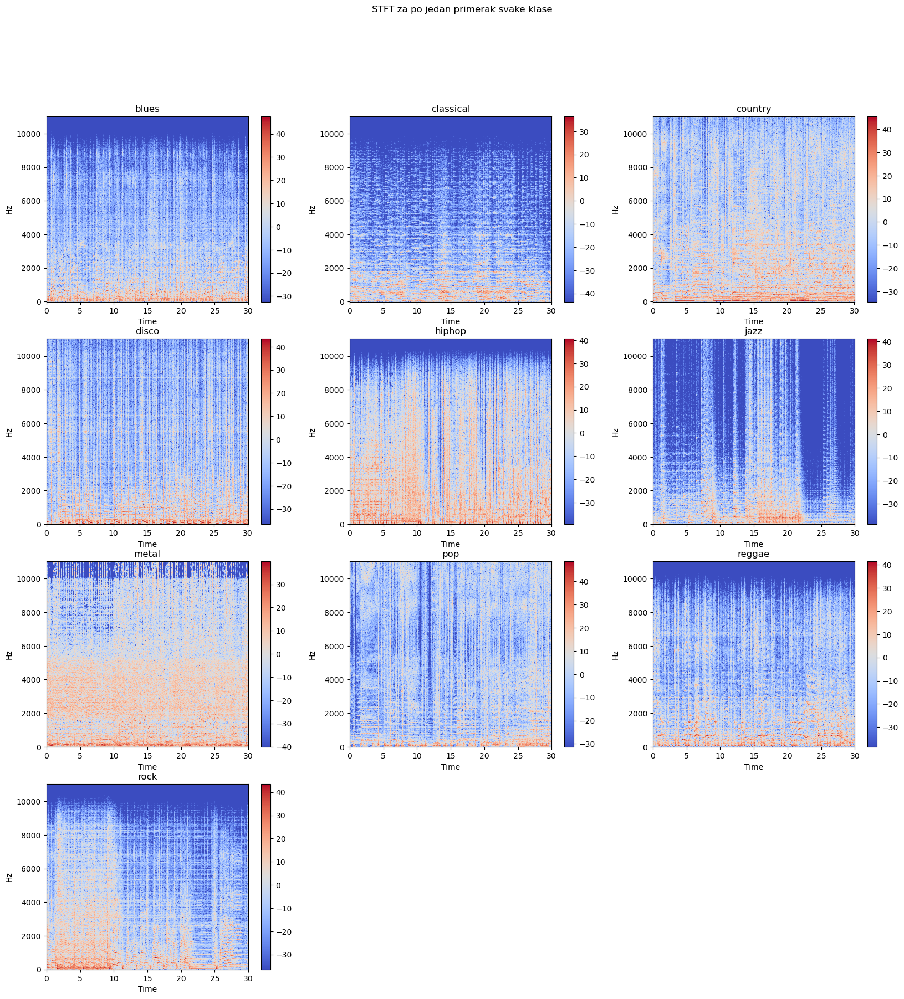

In [8]:
sr = 22050
fig = plt.figure(figsize=(20,20))
fig.suptitle('STFT za po jedan primerak svake klase')
for i in range(0, len(classes)):
    d = data_audio[audio_label ==classes[i]][0]
    stft = librosa.stft(d)
    stft_db = librosa.amplitude_to_db(abs(stft))
    plt.subplot(4,3,i+1)
    librosa.display.specshow(stft_db, sr=sr, x_axis='time', y_axis='hz')
    plt.title(classes[i])
    plt.colorbar()

Могу се приметити веће разлике између класа за обележје stft него прликом приказа амплитуде. Види се сличност између disco и blues, као и разлика између metal и pop жанра.

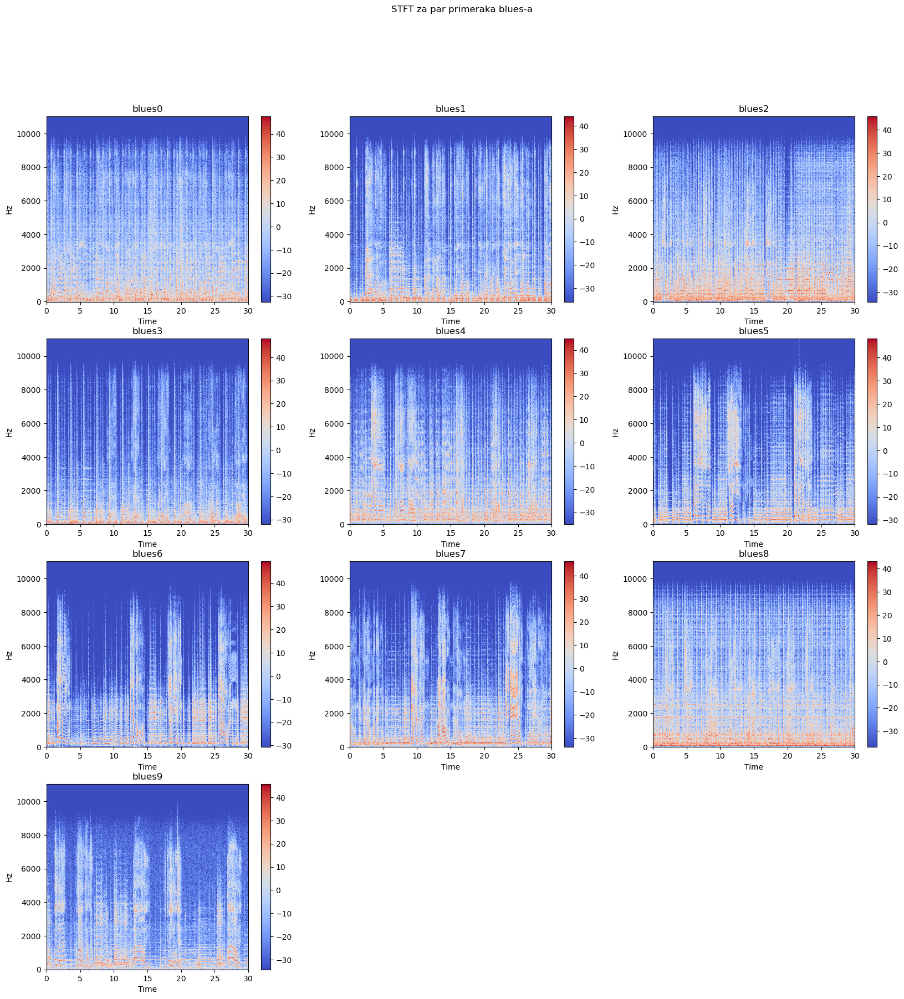

In [9]:
sr = 22050
fig = plt.figure(figsize=(20,20))
fig.suptitle('STFT za par primeraka blues-a')
i = 0;
for  d in data_audio[audio_label == classes[0]][0:10]:
    stft = librosa.stft(d)
    stft_db = librosa.amplitude_to_db(abs(stft))
    plt.subplot(4,3,i+1)
    librosa.display.specshow(stft_db, sr=sr, x_axis='time', y_axis='hz')
    plt.title(classes[0]+str(i))
    i = i+1
    plt.colorbar()

Посматрајући stft обележја за blues жанр може се видети много већа међусобна сличност него приликом посматрања амплитуде, што потврђује да ово обележје садржи више информација.

## Mel-frequency cepstral coefficients (MFCC) 

Човек може боље да примети промене у нижим фреквенцијама него у вишим, зато што је функција чулне осетљивости човека нелинеарна и блиска експоненцијалној.Зато трансформишемо податке mel-скалом да би боље приказивали звук који чујемо. MFCC користи mel-скалу да подели фреквенцијски опсег у више делова и онда примењујемо дискретну косинусну трансформацију да би се извукли најбитнији делови информација из нашег улаза. Ово обележје је корисно јер смањује количину података са којима се ради јер видеи заузимају доста меморије, па на овај начин компресујемо податке, али такође овиме губимо доста корисних информација.

## Zero crossing

Oво обележје представља број проласка кроз нулу и користи се да се види колико често се мења амплитуда.

## Chroma

Chroma се најчешће користи зато што може добре да издвоји хармонијске и мелодијске карактеристике звука при чему је робусна на промене квалитета звука и инструмент.

The number of zero-crossing is : 12


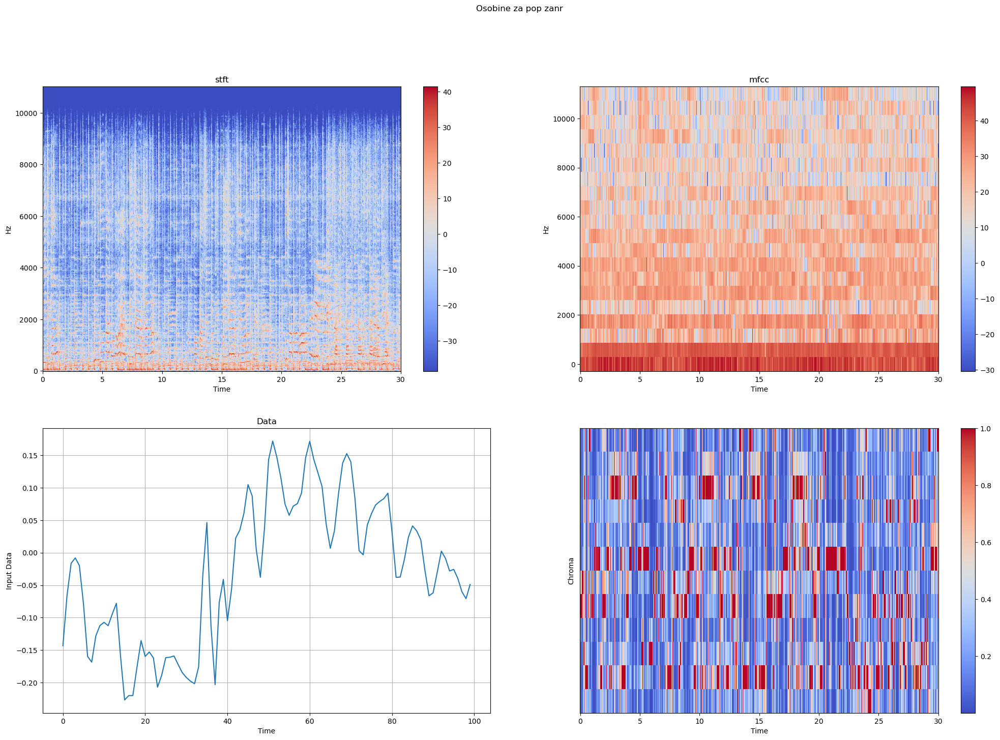

In [10]:
sr = 22050
fig = plt.figure(figsize=(25,16))
fig.suptitle('Osobine za pop zanr')
d = data_audio[audio_label ==classes[8]][0]
stft = librosa.stft(d)
stft_db = librosa.amplitude_to_db(abs(stft))
mfcc = librosa.feature.mfcc(y=d)
mfcc_db = librosa.amplitude_to_db(abs(mfcc))
zcr = librosa.zero_crossings(d[1000:1100], pad=False)
chroma = librosa.feature.chroma_stft(y=d, sr=sr)
plt.subplot(2,2,1)
librosa.display.specshow(stft_db, sr=sr, x_axis='time', y_axis='hz')
plt.title('stft')
plt.colorbar()
plt.subplot(2,2,2)
librosa.display.specshow(mfcc_db, sr=sr, x_axis='time', y_axis='hz')
plt.title('mfcc')
plt.colorbar()
plt.subplot(2,2,3)
plt.plot(d[1000:1100])
plt.xlabel('Time')
plt.ylabel('Input Data')
plt.grid(True)
plt.title('Data')
plt.subplot(2,2,4)
librosa.display.specshow(chroma, sr=sr, x_axis='time', cmap='coolwarm')
plt.ylabel('Chroma')
plt.colorbar()
print("The number of zero-crossing is :",sum(zcr))

На графику изнад су приказна сва претходно поменута обележја за жанр pop.

Као обележја смо користили само stft, јер коришће сва 4 обележја је заузимало огромну количину меморије коју нисмо имали.

## Претпроцесирање  и избалансираност података

In [11]:
spec = np.empty([9990, 130, 1025])
sr = 22050
samples_per_seg = int(sr*30/num_segments)
bad_index = []
for i in range(0, len(data_audio)-1):
    for j in range(0,num_segments):
        try:
            spec[i*10+j] = librosa.amplitude_to_db(abs(librosa.stft((data_audio[i])[j*samples_per_seg:(j+1)*samples_per_seg], n_fft=2048, hop_length=512))).T
            
        except:
             bad_index.append(i*10+j);
            

Један фајл је избачен јер није могао да се учита, док су преостали подаци подељени на по 3 секунде да би се тиме добило више података. На крају се уклањају подаци приликом чијег генерисања је дошло до неке грешке.
С обзиром да имамо десет класа потребно је да класе лабелирамо категоричким обележјима код којих је класа к представљена вектором који на индексу к има јединицу а на свим осталим индексима има нулу.

In [12]:
audio_label = np.array(audio_label)
audio_label[audio_label == 'blues'] = 0
audio_label[audio_label == 'classical'] = 1
audio_label[audio_label == 'country'] = 2
audio_label[audio_label == 'disco'] = 3
audio_label[audio_label == 'hiphop'] = 4
audio_label[audio_label == 'jazz'] = 5
audio_label[audio_label == 'metal'] = 6
audio_label[audio_label == 'pop'] = 7
audio_label[audio_label == 'reggae'] = 8
audio_label[audio_label == 'rock'] = 9
audio_label = np.repeat(audio_label,10)

Text(0.5, 0, 'Class')

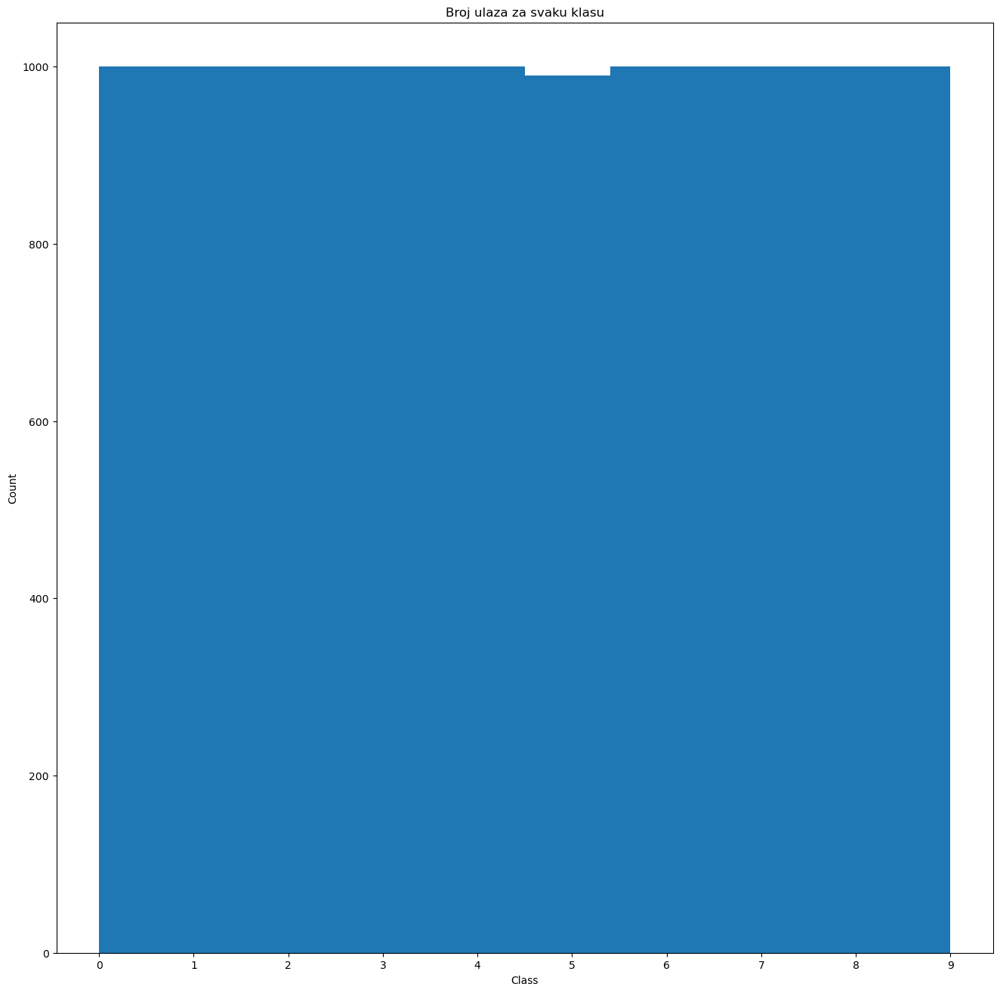

In [13]:
plt.figure(figsize = (16,16))
plt.hist(audio_label)
plt.title('Broj ulaza za svaku klasu')
plt.ylabel('Count')
plt.xlabel('Class')

In [14]:
audio_label = np.delete(audio_label, bad_index, 0)
y = tf.keras.utils.to_categorical(audio_label,num_classes = 10, dtype ="int32")

In [15]:
spec = np.delete(spec, bad_index, 0)

Када посматрамо крајње димензије улазних података можемо видети да имамо 9990 улаза, са 130 временских тренутака од којих је сваки спектар дужине 1025.

In [16]:
spec.shape

(9986, 130, 1025)

Можемо приметити да су подаци избалансирани с обзиром да скоро све класе имају исти број улаза..

# Подела на тест и тренинг скуп и стандардизација

In [17]:
spec_train, spec_test, y_train, y_test = train_test_split(spec,y,test_size = 0.2)

Подаци су подељени на тест и тренинг скуп ради боље валидације модела. Идеја је да се цело обучаваље ради само над тренинг скупом који модел види у току њега а тестирање колико добро ради наш модел се ради над тест скупом који модел пре тога није видео. Уобичајено је да подела на ова два скупа буде у односу 20:80 или 30:70

In [18]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
spec_train_norm = scaler.fit_transform(spec_train.reshape(-1, spec_train.shape[-1])).reshape(spec_train.shape)
spec_test_norm = scaler.transform(spec_test.reshape(-1, spec_test.shape[-1])).reshape(spec_test.shape)
n_out = 10

С обзиром да имамо довољну количину података испуњена је централна гранична теорема и можемо сматрати да су подаци нормално расподељени и из тог разлога користимо стандардизацију. Не можемо знати тачну вредност минимума и максимума наших обележја што су овде заправо спектралне компоненте па је та опција сигурнија.
Такође, с обѕиром да су наши подаци 3D  морамо их претворити у 2D да би могли да се пошаљу функцији за стандардизацију. С обзиром да хоћемо да урадимо стандардизацију само по оси обележја мењамо облик матрице из (9986,130,1025) у (9986*130,1025).

# Формирање модела

In [19]:
model = Sequential()
model.add(tf.keras.layers.LSTM(64, input_shape= (spec_train_norm.shape[1],spec_train_norm.shape[2]),dropout = 0.2, return_sequences = True))
model.add(tf.keras.layers.LSTM(64, dropout=0.5))
model.add(Dense(64, activation= 'relu'))
model.add(Dense(10, activation= 'softmax'))

model.compile(optimizer= tf.keras.optimizers.Adam(lr = 0.001), loss= 'categorical_crossentropy',metrics='accuracy')

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 130, 64)           279040    
                                                                 
 lstm_1 (LSTM)               (None, 64)                33024     
                                                                 
 dense (Dense)               (None, 64)                4160      
                                                                 
 dense_1 (Dense)             (None, 10)                650       
                                                                 
Total params: 316,874
Trainable params: 316,874
Non-trainable params: 0
_________________________________________________________________


C:\ProgramData\Anaconda3\lib\site-packages\keras\optimizers\optimizer_v2\adam.py:110: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


У моделу коришћена су два LSTM слоја који су један тип рекурентне неуралне мреже, а последнја два слоја су потпуно повезана.
LSTM се користи код временских серија да би ухватио временску зависност података. улаз у њега је нека секвенца ( у нашем случају xi је спектар тренутног прозора а hi би требало да буде предикција спектра суседног наредног прозора.

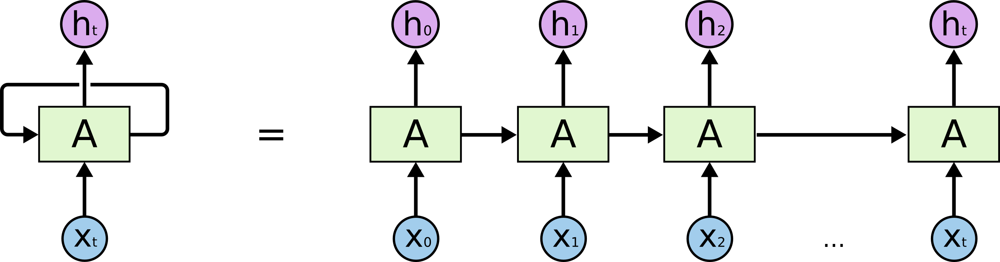

LSTM  успева да ухвати контекст тако што користи три ћелије. Прва ћелија (f) контролише који део од података које нам шаље претходни одбирак ће бити задржан а који заборављен. Друга ћелија (i) контролише који део предикције коју смо ми правили чувамо а који заборавлјамо, и последња ћелија (o) контролише који део тога шаљемо на излаз као коначну предикцију. У
$\tilde{C}$ се генерише предикција наше тренутне ћелије, а у C оно што ће заиста у њој бити сачувано и послато наредној и њен садржај се одређује на основу претходних предикција које су направљене (меморије) и новонаправљене предикције одакле и потиче само име модела Long Short Term Memory јер је поента да памтимо неке закључке о контексту које смо већ научили али да не упамтимо превише јер онда нећемо бити довољно адаптивни на промене.

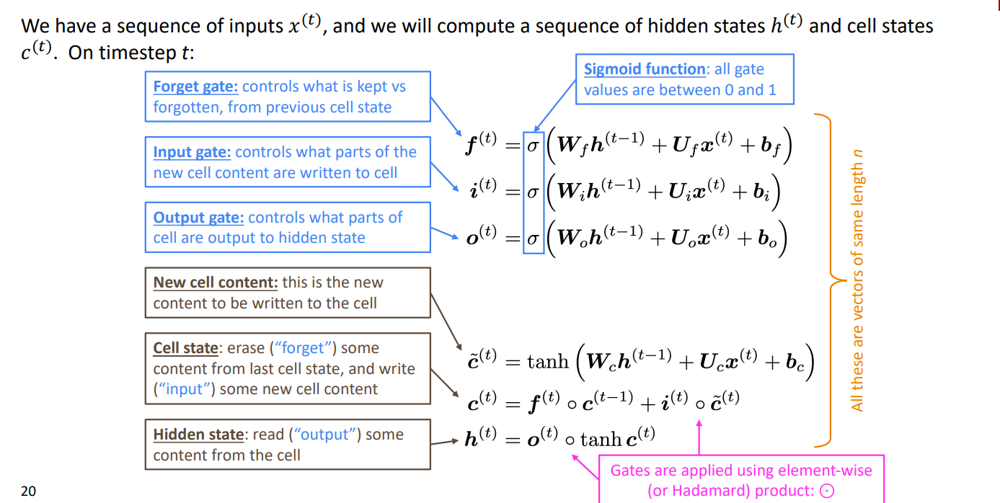

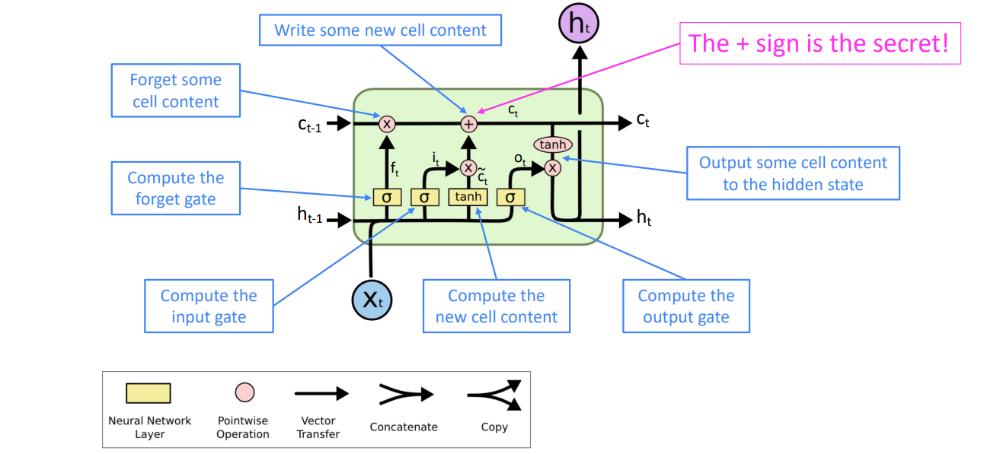

С обзиром да радимо класификацију и користимо више класа коришћена је categorical_crossentropy критеријумска функција. Идеја иза ње је да што се подаци чешће или превише ретко појављују то носе мање информација, а највише информација носе подаци који се средње често појављују. Такође, сама ентропија система мери његову уређеност, па што је систем уређенији иам мању ентропију и грешка коју правимо је мања а што је мање урђен има већу ентропију у грешка коју правимо је већа.

Као активациона функција коришћена је relu за унутрашње слојеве јер је најмања сложеност рачунања градијента и даје најбоље резултате у пракси. За оптимизацију је коришћен Адам како би се успориле коризонталне осцилације грешке.

#### RELU

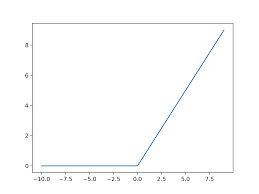

#### CROSS ENTROPY LOSS

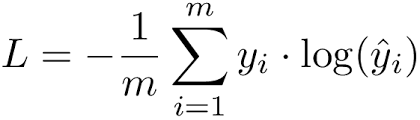

Ради заштите од преобучавања коришћен је dropout  унутар LSTM-ова. Идеја ове технике је да се у току обучавања користи само p% неурона, и то у свакој итерацији се бира на рандом p% индекса неурона који ће у тој итерацији бити коришћени. На овај начин отежавамо мрежи да се превише навикне на било који од њих и касније у току тестирања користе се сви неурони тако да добијамо боље резултате него раније.

# Тренирење модела

In [20]:
history = model.fit(spec_train_norm,y_train,epochs=40,batch_size = 32,validation_data=(spec_test_norm, y_test),verbose=1)
model.save('GTZAN_LSTM_1.h5')

Epoch 1/40
250/250 [==============================] - 75s 266ms/step - loss: 1.6524 - accuracy: 0.4054 - val_loss: 1.4396 - val_accuracy: 0.4740
Epoch 2/40
250/250 [==============================] - 57s 228ms/step - loss: 1.3517 - accuracy: 0.5175 - val_loss: 1.3387 - val_accuracy: 0.5145
Epoch 3/40
250/250 [==============================] - 61s 245ms/step - loss: 1.1997 - accuracy: 0.5762 - val_loss: 1.2105 - val_accuracy: 0.5736
Epoch 4/40
250/250 [==============================] - 60s 242ms/step - loss: 1.1404 - accuracy: 0.6012 - val_loss: 1.0930 - val_accuracy: 0.6266
Epoch 5/40
250/250 [==============================] - 58s 233ms/step - loss: 0.9870 - accuracy: 0.6534 - val_loss: 1.0526 - val_accuracy: 0.6321
Epoch 6/40
250/250 [==============================] - 57s 228ms/step - loss: 0.8705 - accuracy: 0.6983 - val_loss: 0.9246 - val_accuracy: 0.6837
Epoch 7/40
250/250 [==============================] - 59s 236ms/step - loss: 0.7918 - accuracy: 0.7257 - val_loss: 0.8327 - val_ac

<div style="page-break-after: always;"></div>

# Приказ перформанси кроз епохе

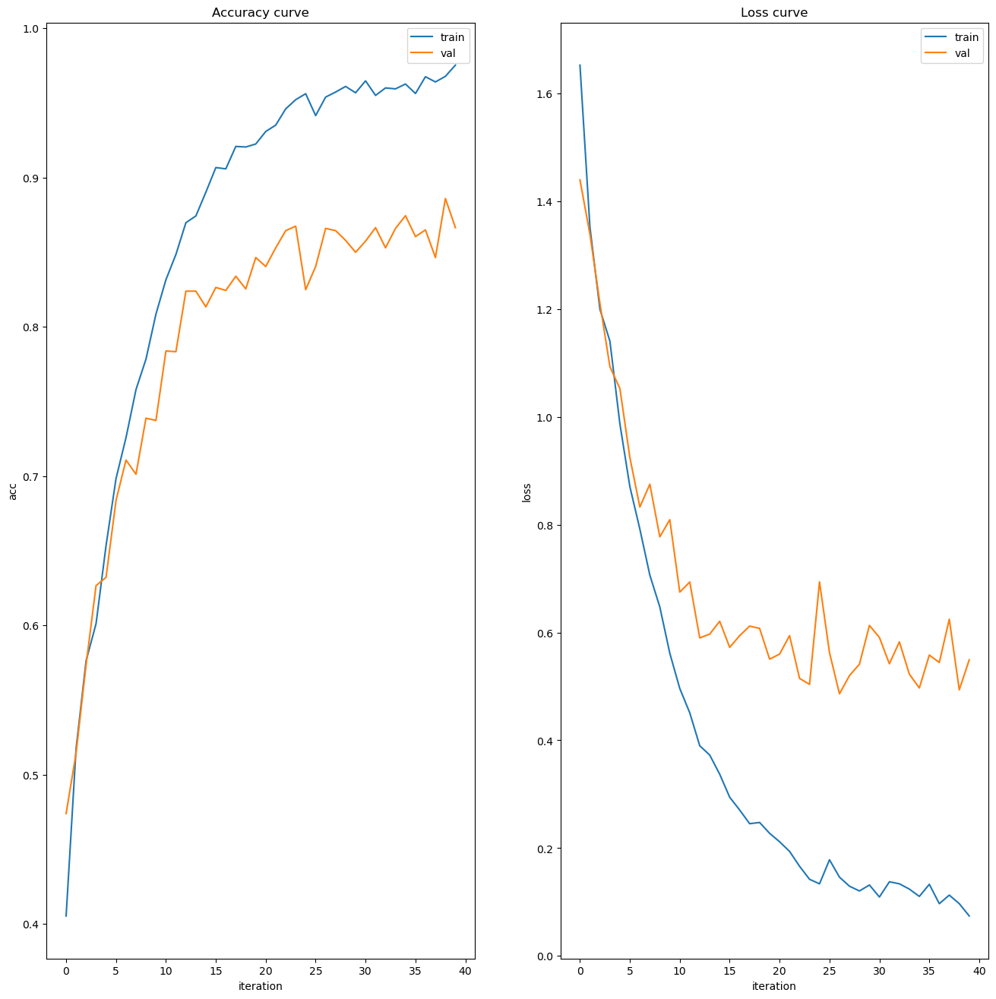

In [21]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
plt.figure(figsize = (16,16))
plt.subplot(121)
plt.plot(acc)
plt.plot(val_acc)
plt.title('Accuracy curve')
plt.xlabel('iteration')
plt.ylabel('acc')
plt.legend(['train', 'val'])
plt.subplot(122)
plt.plot(loss)
plt.plot(val_loss)
plt.title('Loss curve')
plt.xlabel('iteration')
plt.ylabel('loss')
plt.legend(['train', 'val'])
plt.show()

Тачност и прецизност делује да су добре, с обзиром да валидациона крива веци део епоха  у просеку расте до неког момента када пред крај када стагнира.

In [22]:
y_pred_train = model.predict(spec_train_norm, verbose=1)

250/250 [==============================] - 34s 127ms/step


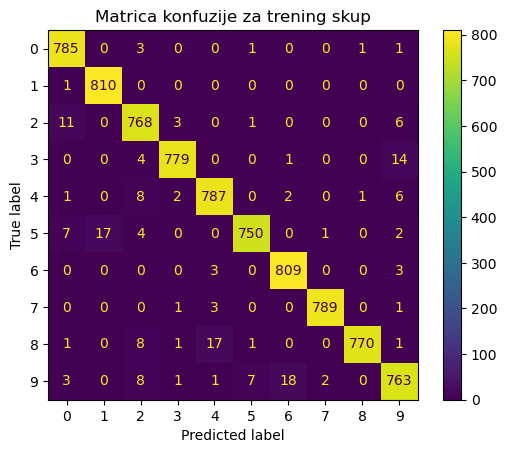

In [23]:
y_train_num = np.argmax(y_train,1);
y_train_pred_num = np.argmax(y_pred_train,1);
confusion_matrix = metrics.confusion_matrix(y_train_num, y_train_pred_num)
cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix)
cm_display.plot()
plt.title('Matrica konfuzije za trening skup')
plt.show()

In [24]:
y_pred_test = model.predict(spec_test_norm, verbose=1)

63/63 [==============================] - 8s 131ms/step


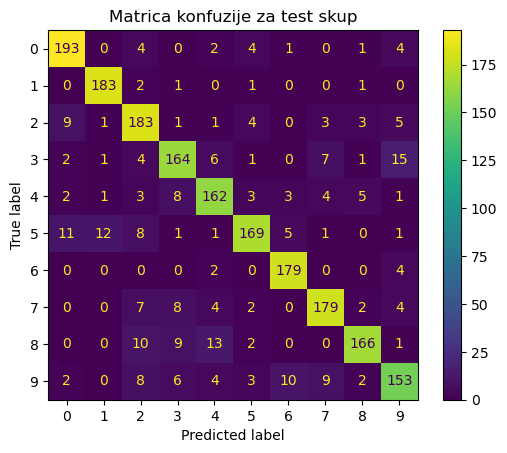

In [25]:
y_test_num = np.argmax(y_test,1);
y_test_pred_num = np.argmax(y_pred_test,1);
confusion_matrix = metrics.confusion_matrix(y_test_num, y_test_pred_num)
cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix)
cm_display.plot()
plt.title('Matrica konfuzije za test skup')
plt.show()

Видимо да и конфузиона матрица за тест и за тренинг скуп дају добре резулатате и грешке свих редова су добре.


# Примери добро класификованих улаза

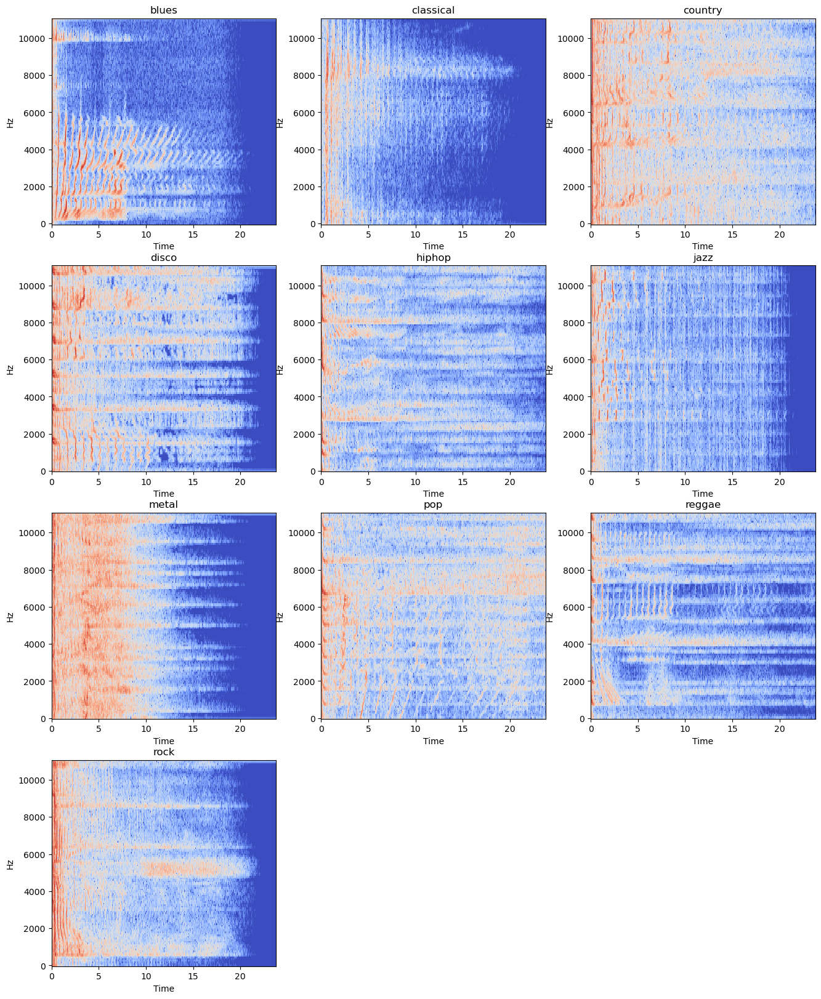

In [26]:
plt.figure(figsize = (16,20))
for c in range(0,len(classes)):
    stft = spec_test[(y_test_num == c) & (y_test_pred_num == c)]
    if(len(stft)>0):
        stft = stft[0]
        plt.subplot(4,3,c+1)
        librosa.display.specshow(stft, sr=sr, x_axis='time', y_axis='hz')
        plt.title(classes[c])   


# Примери лоше класификованих улаза

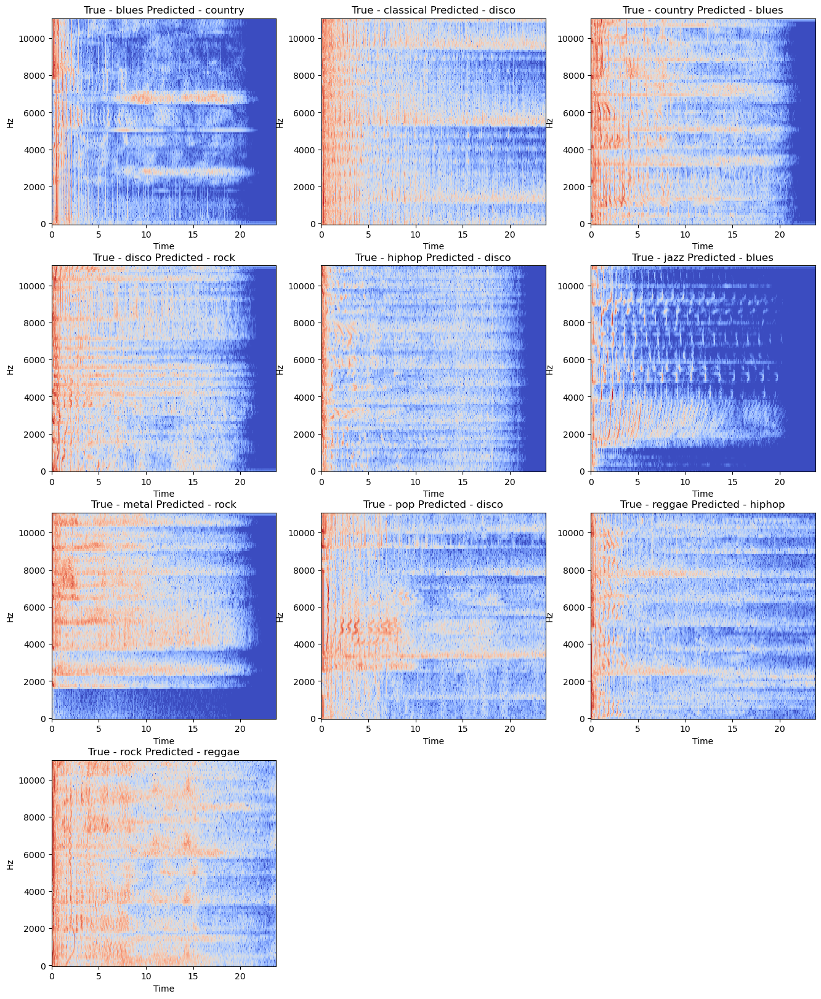

In [27]:
plt.figure(figsize = (16,20))
for c in range(0,len(classes)):
    stft = spec_test[(y_test_num == c) & (y_test_pred_num != c)][0]
    j = y_test_pred_num[(y_test_num == c) & (y_test_pred_num != c)][0]
    plt.subplot(4,3,c+1)
    librosa.display.specshow(stft, sr=sr, x_axis='time', y_axis='hz')
    plt.title('True - '+classes[c]+' Predicted - '+classes[j])   